In [1]:
# Test cell for environment and dependency verification
import os
import sys
import platform

# Python and environment information
print(f"Python version: {platform.python_version()}")
print(f"Platform: {platform.platform()}")

# Check for CUDA
try:
    import torch
    print(f"PyTorch version: {torch.__version__}")
    print(f"CUDA available: {torch.cuda.is_available()}")
    if torch.cuda.is_available():
        print(f"CUDA version: {torch.version.cuda}")
        print(f"GPU device: {torch.cuda.get_device_name(0)}")
        print(f"Number of GPUs: {torch.cuda.device_count()}")
    else:
        print("CUDA is not available - training will use CPU")
except ImportError:
    print("PyTorch is not installed - you'll need to install it with pip install torch torchvision")

# Check for other required libraries
required_packages = ['numpy', 'matplotlib', 'pandas', 'opencv-python', 'ultralytics']

for package in required_packages:
    try:
        if package == 'opencv-python':
            import cv2
            print(f"✅ {package} is installed (version: {cv2.__version__})")
        else:
            module = __import__(package.replace('-', '_'))
            print(f"✅ {package} is installed (version: {module.__version__})")
    except ImportError:
        print(f"❌ {package} is NOT installed - use pip install {package}")
    except AttributeError:
        print(f"✅ {package} is installed (version unknown)")

# Manually set the project root path to ensure accuracy
project_root = "/home/peter/Desktop/TU PHD/WildlifeDetectionSystem"
print(f"\nProject root path: {project_root}")

# Output the current working directory for reference
print(f"Current working directory: {os.getcwd()}")

# Define expected data paths and include alternate paths
data_paths = {
    'raw_images': os.path.join(project_root, 'data', 'raw_images'),
    'export_yolo_alt': os.path.join(project_root, 'data', 'export', 'yolo_export'),
    'models': os.path.join(project_root, 'models', 'trained'),
    'notebooks': os.path.join(project_root, 'notebooks')
}

# Check if directories exist and list sample files if they do
for name, path in data_paths.items():
    if os.path.exists(path):
        print(f"✅ {name} directory exists: {path}")
        try:
            files = os.listdir(path)
            if files:
                print(f"   Sample files: {files[:3]}")
            else:
                print(f"   Directory is empty")
        except Exception as e:
            print(f"   Error listing directory: {e}")
    else:
        print(f"❌ {name} directory does not exist: {path}")

# Check if we need to create any directories
missing_dirs = [path for name, path in data_paths.items() if not os.path.exists(path) and 'alt' not in name]
if missing_dirs:
    print("\nWould you like to create the missing directories? (y/n)")
    # Uncomment the line below to auto-create directories if needed
    # for path in missing_dirs:
    #     os.makedirs(path, exist_ok=True)
    #     print(f"Created directory: {path}")

print("\nEnvironment setup check complete!")

Python version: 3.12.3
Platform: Linux-6.8.0-58-generic-x86_64-with-glibc2.39
PyTorch version: 2.6.0+cu124
CUDA available: True
CUDA version: 12.4
GPU device: NVIDIA GeForce RTX 4050 Laptop GPU
Number of GPUs: 1
✅ numpy is installed (version: 2.1.1)
✅ matplotlib is installed (version: 3.10.1)
✅ pandas is installed (version: 2.2.3)
✅ opencv-python is installed (version: 4.11.0)
✅ ultralytics is installed (version: 8.3.106)

Project root path: /home/peter/Desktop/TU PHD/WildlifeDetectionSystem
Current working directory: /home/peter/Desktop/TU PHD/WildlifeDetectionSystem/notebooks/training
✅ raw_images directory exists: /home/peter/Desktop/TU PHD/WildlifeDetectionSystem/data/raw_images
   Sample files: ['test_01']
✅ export_yolo_alt directory exists: /home/peter/Desktop/TU PHD/WildlifeDetectionSystem/data/export/yolo_export
   Sample files: ['labels', 'images', 'classes.txt']
✅ models directory exists: /home/peter/Desktop/TU PHD/WildlifeDetectionSystem/models/trained
   Sample files: ['wil

YOLO Dataset Structure:
Classes file exists: True
Train images folder exists: True
Train labels folder exists: True
Val images folder exists: True
Val labels folder exists: True

Classes (28): ['Red Deer', 'Male Roe Deer', 'Female Roe Deer', 'Fallow Deer', 'Wild Boar', 'Chamois', 'Fox', 'Wolf', 'Jackal', 'Brown Bear', 'Badger', 'Weasel', 'Stoat', 'Polecat', 'Marten', 'Otter', 'Wildcat', 'Rabbit', 'Hare', 'Squirrel', 'Dormouse', 'Hedgehog', 'Turtle', 'Blackbird', 'Nightingale', 'Pheasant', 'Human', 'Background']

Training annotation files: 358
Validation annotation files: 90

Annotation distribution by class (from first 500 training files):
  Male Roe Deer: 14 (18.7%)
  Female Roe Deer: 13 (17.3%)
  Fallow Deer: 1 (1.3%)
  Fox: 9 (12.0%)
  Jackal: 4 (5.3%)
  Badger: 2 (2.7%)
  Rabbit: 22 (29.3%)
  Squirrel: 1 (1.3%)
  Turtle: 2 (2.7%)
  Human: 7 (9.3%)

Displaying random training samples with annotations:


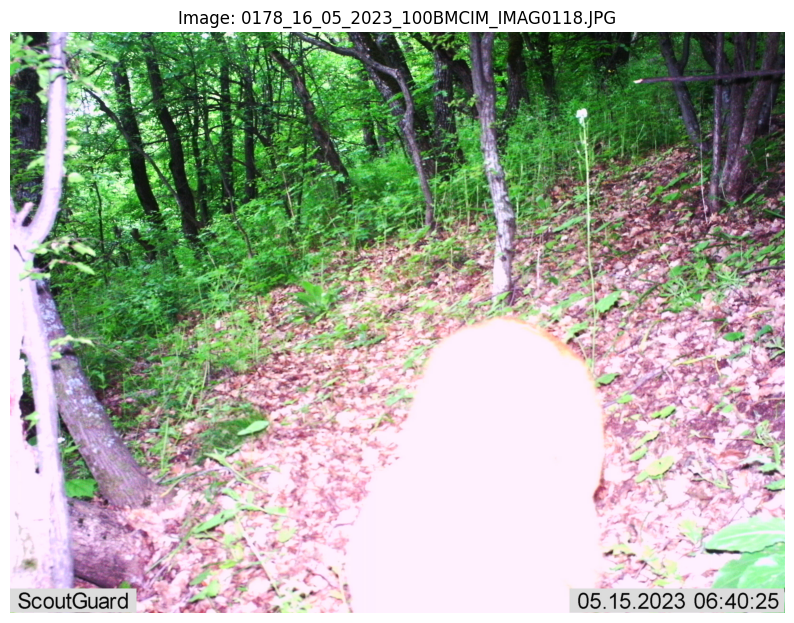

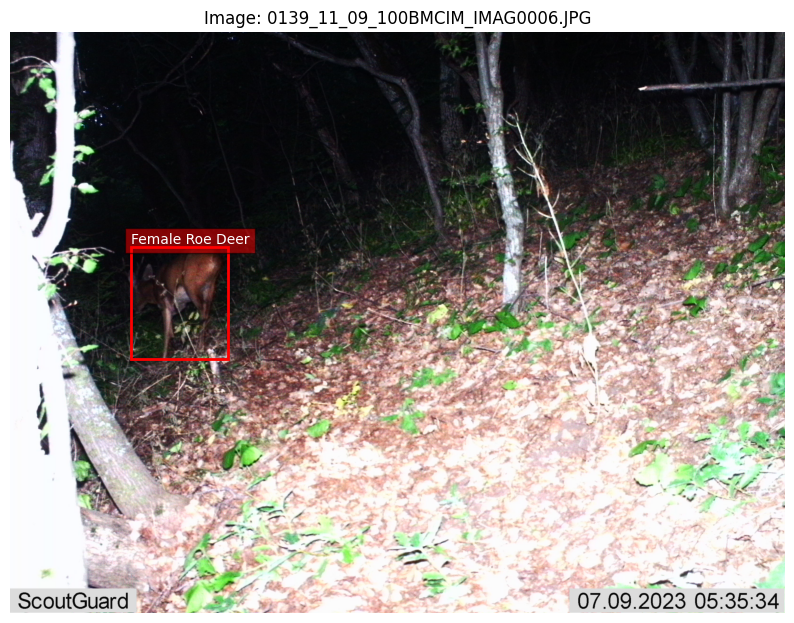

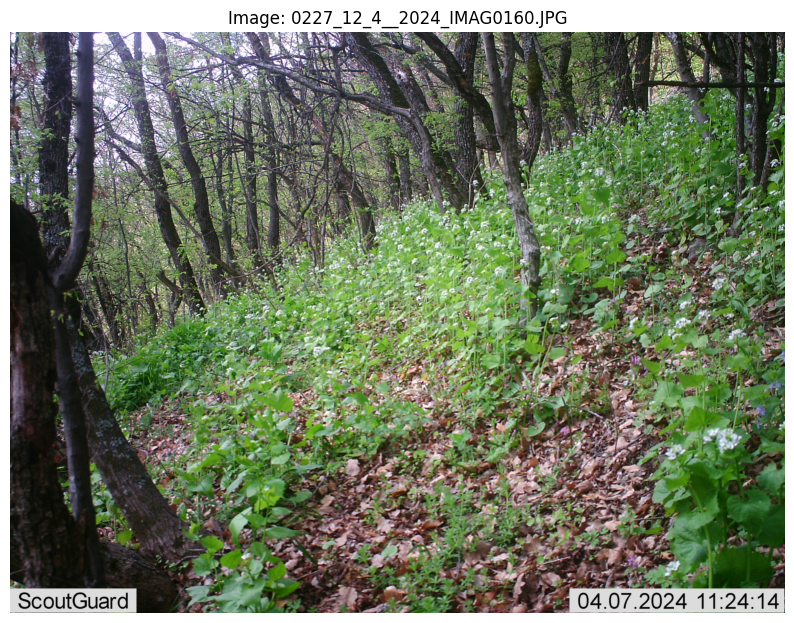

In [2]:
# Cell 2: Data Configuration and Exploration - REVISED for proper YOLO directory structure
import os
from ultralytics import YOLO
import matplotlib.pyplot as plt
import cv2
import numpy as np
from PIL import Image

# Define dataset paths
data_dir = "/home/peter/Desktop/TU PHD/WildlifeDetectionSystem/data"
yolo_dataset_path = os.path.join(data_dir, "export/yolo_export")
model_save_dir = "/home/peter/Desktop/TU PHD/WildlifeDetectionSystem/models/trained"

# Check YOLO dataset structure
print("YOLO Dataset Structure:")
print(f"Classes file exists: {os.path.exists(os.path.join(yolo_dataset_path, 'classes.txt'))}")
print(f"Train images folder exists: {os.path.exists(os.path.join(yolo_dataset_path, 'images/train'))}")
print(f"Train labels folder exists: {os.path.exists(os.path.join(yolo_dataset_path, 'labels/train'))}")
print(f"Val images folder exists: {os.path.exists(os.path.join(yolo_dataset_path, 'images/val'))}")
print(f"Val labels folder exists: {os.path.exists(os.path.join(yolo_dataset_path, 'labels/val'))}")

# Read class names
with open(os.path.join(yolo_dataset_path, 'classes.txt'), 'r') as f:
    class_names = [line.strip() for line in f.readlines()]
print(f"\nClasses ({len(class_names)}): {class_names}")

# Count annotations per class in training set
train_labels_folder = os.path.join(yolo_dataset_path, 'labels/train')
val_labels_folder = os.path.join(yolo_dataset_path, 'labels/val')

train_label_files = os.listdir(train_labels_folder) if os.path.exists(train_labels_folder) else []
val_label_files = os.listdir(val_labels_folder) if os.path.exists(val_labels_folder) else []

print(f"\nTraining annotation files: {len(train_label_files)}")
print(f"Validation annotation files: {len(val_label_files)}")

# Count annotations per class
class_counts = {i: 0 for i in range(len(class_names))}
total_annotations = 0

# Process training files
for label_file in train_label_files[:500]:  # Sample first 500 for speed
    label_path = os.path.join(train_labels_folder, label_file)
    try:
        with open(label_path, 'r') as f:
            for line in f.readlines():
                parts = line.strip().split()
                if len(parts) >= 5:  # Valid label format
                    class_id = int(parts[0])
                    if class_id in class_counts:
                        class_counts[class_id] += 1
                        total_annotations += 1
    except Exception as e:
        print(f"Error reading {label_file}: {e}")

# Display class distribution
print("\nAnnotation distribution by class (from first 500 training files):")
for class_id, count in class_counts.items():
    if count > 0:
        percentage = (count / total_annotations) * 100 if total_annotations > 0 else 0
        print(f"  {class_names[class_id]}: {count} ({percentage:.1f}%)")

# Visualize a few samples
def display_sample_with_annotations(image_path, label_path, class_names):
    # Read image
    image = cv2.imread(image_path)
    if image is None:
        print(f"Could not read image: {image_path}")
        return
        
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    height, width, _ = image.shape
    
    # Read annotations
    boxes = []
    classes = []
    try:
        with open(label_path, 'r') as f:
            for line in f.readlines():
                parts = line.strip().split()
                if len(parts) >= 5:
                    class_id = int(parts[0])
                    x_center, y_center, w, h = map(float, parts[1:5])
                    
                    # Convert from normalized YOLO format to pixel coordinates
                    x1 = int((x_center - w/2) * width)
                    y1 = int((y_center - h/2) * height)
                    x2 = int((x_center + w/2) * width)
                    y2 = int((y_center + h/2) * height)
                    
                    boxes.append((x1, y1, x2, y2))
                    classes.append(class_id)
    except Exception as e:
        print(f"Error reading labels: {e}")
    
    # Plot image with boxes
    plt.figure(figsize=(10, 8))
    plt.imshow(image)
    for (x1, y1, x2, y2), class_id in zip(boxes, classes):
        plt.gca().add_patch(plt.Rectangle((x1, y1), x2-x1, y2-y1, 
                           fill=False, edgecolor='red', linewidth=2))
        class_name = class_names[class_id] if class_id < len(class_names) else f"Unknown {class_id}"
        plt.text(x1, y1-10, class_name, 
                bbox=dict(facecolor='red', alpha=0.5), fontsize=10, color='white')
    plt.axis('off')
    plt.title(f"Image: {os.path.basename(image_path)}")
    plt.show()

# Display 3 random samples with annotations from training set
import random
train_image_folder = os.path.join(yolo_dataset_path, 'images/train')
if os.path.exists(train_image_folder) and len(os.listdir(train_image_folder)) > 0:
    image_files = os.listdir(train_image_folder)
    sample_image_files = random.sample(image_files, min(3, len(image_files)))
    
    print("\nDisplaying random training samples with annotations:")
    for image_file in sample_image_files:
        image_path = os.path.join(train_image_folder, image_file)
        base_name = os.path.splitext(image_file)[0]
        label_file = f"{base_name}.txt"
        label_path = os.path.join(train_labels_folder, label_file)
        
        if os.path.exists(label_path):
            display_sample_with_annotations(image_path, label_path, class_names)
        else:
            print(f"No label file found for {image_file}")
else:
    print("No training images found to display")

In [3]:
# Cell 3: YOLOv8 Model Configuration - With improved parameters for small datasets
# Set up YAML configuration file path for dataset
yaml_path = os.path.join(yolo_dataset_path, 'data.yaml')
print(f"Checking if YAML config exists: {os.path.exists(yaml_path)}")

# If data.yaml doesn't exist, create it
if not os.path.exists(yaml_path):
    print("Creating data.yaml file...")
    
    # Get relative paths for train and val
    train_path = "images/train"  # Standard YOLO structure
    val_path = "images/val"      # Standard YOLO structure
    
    yaml_content = f"""
# YOLOv8 Dataset Configuration
path: {yolo_dataset_path}  # dataset root dir
train: {train_path}  # train images (relative to 'path')
val: {val_path}  # val images (relative to 'path')
test:  # test images (optional)

# Classes
names:
"""
    
    # Add class names to YAML
    for i, class_name in enumerate(class_names):
        yaml_content += f"  {i}: {class_name}\n"
    
    # Write YAML file
    with open(yaml_path, 'w') as f:
        f.write(yaml_content)
    
    print(f"Created data.yaml with {len(class_names)} classes")

# Print YAML file content
with open(yaml_path, 'r') as f:
    print("\nData YAML Configuration:")
    print(f.read())

# Initialize model (pre-trained on COCO dataset)
# Using a nano model for better performance with small datasets
model = YOLO('yolov8n.pt')  # 'n' for nano, better for small datasets

print("\nModel Architecture:")
print(f"Model type: {type(model)}")
print(f"Pretrained on: COCO dataset (80 classes)")
print(f"Base model size: YOLOv8n (Nano - better for small datasets)")
print(f"Number of new classes to train for: {len(class_names)}")

# Set training parameters optimized for small, imbalanced datasets
EPOCHS = 100
IMAGE_SIZE = 640
BATCH_SIZE = 8
PATIENCE = 25
WARMUP_EPOCHS = 5
WORKERS = 4

print("Starting YOLOv8 Training with optimized small dataset settings...")
print(f"Training parameters:")
print(f"- Epochs: {EPOCHS}")
print(f"- Image size: {IMAGE_SIZE}")
print(f"- Batch size: {BATCH_SIZE}")
print(f"- Worker threads: {WORKERS}")
print(f"- Early stopping patience: {PATIENCE}")
print(f"- Warmup epochs: {WARMUP_EPOCHS}")
print(f"- Dataset: {yaml_path}")

Checking if YAML config exists: True

Data YAML Configuration:
train: /home/peter/Desktop/TU PHD/WildlifeDetectionSystem/data/export/yolo_export/images/train
val: /home/peter/Desktop/TU PHD/WildlifeDetectionSystem/data/export/yolo_export/images/val
nc: 28
names: ['Red Deer', 'Male Roe Deer', 'Female Roe Deer', 'Fallow Deer', 'Wild Boar', 'Chamois', 'Fox', 'Wolf', 'Jackal', 'Brown Bear', 'Badger', 'Weasel', 'Stoat', 'Polecat', 'Marten', 'Otter', 'Wildcat', 'Rabbit', 'Hare', 'Squirrel', 'Dormouse', 'Hedgehog', 'Turtle', 'Blackbird', 'Nightingale', 'Pheasant', 'Human', 'Background']


Model Architecture:
Model type: <class 'ultralytics.models.yolo.model.YOLO'>
Pretrained on: COCO dataset (80 classes)
Base model size: YOLOv8n (Nano - better for small datasets)
Number of new classes to train for: 28
Starting YOLOv8 Training with optimized small dataset settings...
Training parameters:
- Epochs: 100
- Image size: 640
- Batch size: 8
- Worker threads: 4
- Early stopping patience: 25
- Warmup 

In [4]:
# Cell 4: Model Training - Optimized for wildlife detection (with reduced resource usage)
import time

# Create directories if they don't exist
os.makedirs(model_save_dir, exist_ok=True)

# Set training parameters - adjusted for wildlife dataset and lower resource usage
EPOCHS = 100           # Reduced from 150 for stability
IMAGE_SIZE = 640       # Standard YOLO size
BATCH_SIZE = 8         # Reduced from 16 to lower memory requirements
PATIENCE = 25          # Increased patience for handling class imbalance
WARMUP_EPOCHS = 3      # Warm up learning rate
WORKERS = 4            # Reduced from default 8

# Switch to a more lightweight model
if 'model' in locals() and type(model).__name__ == 'YOLO' and hasattr(model, 'model') and model.model.yaml['width_multiple'] > 0.33:
    print("Switching to a lighter YOLOv8n model to reduce GPU memory usage")
    model = YOLO('yolov8n.pt')  # Use nano model instead of small

print("Starting YOLOv8 Training with optimized resource settings...")
print(f"Training parameters:")
print(f"- Epochs: {EPOCHS}")
print(f"- Image size: {IMAGE_SIZE}")
print(f"- Batch size: {BATCH_SIZE} (reduced for stability)")
print(f"- Worker threads: {WORKERS} (reduced for stability)")
print(f"- Early stopping patience: {PATIENCE}")
print(f"- Warmup epochs: {WARMUP_EPOCHS}")
print(f"- Dataset: {yaml_path}")
print(f"- Model save directory: {model_save_dir}")
print(f"- Model type: {model.type if hasattr(model, 'type') else 'YOLOv8n'}")

# Start training timer
start_time = time.time()

# Configure training with lower resource usage
# Подобрени параметри за обучение за справяне с малко данни
results = model.train(
    data=yaml_path,
    epochs=EPOCHS,
    imgsz=IMAGE_SIZE,
    batch=BATCH_SIZE,
    patience=PATIENCE,
    project=model_save_dir,
    name='wildlife_detector_improved',  # Ново име за да разграничим от предишните
    pretrained=True,
    optimizer='AdamW',
    lr0=0.0005,               # По-ниска начална скорост
    lrf=0.01,                
    warmup_epochs=5,          # По-дълъг период на загряване
    weight_decay=0.0005,      
    box=7.5,                  
    cls=3.0,                  # Значително увеличен клас загуба за преодоляване на дисбаланса
    hsv_h=0.015,               
    hsv_s=0.7,                
    hsv_v=0.4,                
    degrees=15.0,             # По-голяма ротация
    translate=0.2,            # По-голямо транслиране
    scale=0.6,                # По-голямо мащабиране
    mosaic=1.0,               
    mixup=0.2,                # Увеличено смесване
    copy_paste=0.3,           # Увеличено копиране
    fliplr=0.5,               
    cache=True,               
    save=True,               
    save_period=5,            # Запазване на всеки 5 епохи
    device=0
)

# Calculate training time
training_time = time.time() - start_time
hours, remainder = divmod(training_time, 3600)
minutes, seconds = divmod(remainder, 60)

print(f"\nTraining completed in {int(hours)}h {int(minutes)}m {int(seconds)}s")

# Show training results
print("\nTraining Results:")
print(f"Best mAP50-95: {results.maps[0]:.4f}")
print(f"Best mAP50: {results.maps[1]:.4f}")

# Plot training metrics more carefully - check if metrics exist before plotting
metrics = ['train/box_loss', 'train/cls_loss', 'train/dfl_loss', 
           'metrics/precision', 'metrics/recall', 'metrics/mAP50', 'metrics/mAP50-95']

try:
    # Create a figure with subplots
    plt.figure(figsize=(16, 12))
    plot_count = 0
    
    for i, metric in enumerate(metrics):
        if metric in results.results_dict and len(results.results_dict[metric]) > 0:
            plot_count += 1
            plt.subplot(3, 3, plot_count)
            plt.plot(results.results_dict[metric])
            plt.title(metric)
            plt.grid(True)
    
    if plot_count > 0:
        plt.tight_layout()
        plt.show()
    else:
        print("No metrics available to plot")
except Exception as e:
    print(f"Error plotting metrics: {e}")

Starting YOLOv8 Training with optimized resource settings...
Training parameters:
- Epochs: 100
- Image size: 640
- Batch size: 8 (reduced for stability)
- Worker threads: 4 (reduced for stability)
- Early stopping patience: 25
- Warmup epochs: 3
- Dataset: /home/peter/Desktop/TU PHD/WildlifeDetectionSystem/data/export/yolo_export/data.yaml
- Model save directory: /home/peter/Desktop/TU PHD/WildlifeDetectionSystem/models/trained
- Model type: <bound method Module.type of YOLO(
  (model): DetectionModel(
    (model): Sequential(
      (0): Conv(
        (conv): Conv2d(3, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
        (bn): BatchNorm2d(16, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
        (act): SiLU(inplace=True)
      )
      (1): Conv(
        (conv): Conv2d(16, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
        (bn): BatchNorm2d(32, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
        (act)

train: Scanning /home/peter/Desktop/TU PHD/WildlifeDetectionSystem/data/export/yolo_export/labels/train.cache... 358 images, 284 backgrounds, 1 corrupt: 100%|██████████| 358/358 [00:00<?, ?it/s]

train: WARNING ⚠️ /home/peter/Desktop/TU PHD/WildlifeDetectionSystem/data/export/yolo_export/images/train/0017_28_05_IMAG0157.JPG: corrupt JPEG restored and saved
train: WARNING ⚠️ /home/peter/Desktop/TU PHD/WildlifeDetectionSystem/data/export/yolo_export/images/train/0020_28_05_IMAG0140.JPG: corrupt JPEG restored and saved
train: WARNING ⚠️ /home/peter/Desktop/TU PHD/WildlifeDetectionSystem/data/export/yolo_export/images/train/0022_28_05_IMAG0158.JPG: corrupt JPEG restored and saved
train: WARNING ⚠️ /home/peter/Desktop/TU PHD/WildlifeDetectionSystem/data/export/yolo_export/images/train/0029_8_7_IMAG0017.JPG: corrupt JPEG restored and saved
train: WARNING ⚠️ /home/peter/Desktop/TU PHD/WildlifeDetectionSystem/data/export/yolo_export/images/train/0037_8_7_IMAG0013.JPG: corrupt JPEG restored and saved
train: WARNING ⚠️ /home/peter/Desktop/TU PHD/WildlifeDetectionSystem/data/export/yolo_export/images/train/0041_16_06_IMAG0010.JPG: corrupt JPEG restored and saved
train: WARNING ⚠️ /home/pe

WARNING ⚠️ cache='ram' may produce non-deterministic training results. Consider cache='disk' as a deterministic alternative if your disk space allows.


train: Caching images (0.3GB RAM): 100%|██████████| 357/357 [00:05<00:00, 66.13it/s]
val: Scanning /home/peter/Desktop/TU PHD/WildlifeDetectionSystem/data/export/yolo_export/labels/val.cache... 90 images, 72 backgrounds, 0 corrupt: 100%|██████████| 90/90 [00:00<?, ?it/s]

val: WARNING ⚠️ /home/peter/Desktop/TU PHD/WildlifeDetectionSystem/data/export/yolo_export/images/val/0004_28_05_IMAG0156.JPG: corrupt JPEG restored and saved
val: WARNING ⚠️ /home/peter/Desktop/TU PHD/WildlifeDetectionSystem/data/export/yolo_export/images/val/0060_11_09_100BMCIM_IMAG0077.JPG: corrupt JPEG restored and saved
val: WARNING ⚠️ /home/peter/Desktop/TU PHD/WildlifeDetectionSystem/data/export/yolo_export/images/val/0070_11_09_100BMCIM_IMAG0070.JPG: corrupt JPEG restored and saved
val: WARNING ⚠️ /home/peter/Desktop/TU PHD/WildlifeDetectionSystem/data/export/yolo_export/images/val/0137_11_09_100BMCIM_IMAG0110.JPG: corrupt JPEG restored and saved
val: WARNING ⚠️ /home/peter/Desktop/TU PHD/WildlifeDetectionSystem/data/export/yolo_export/images/val/0151_11_09_100BMCIM_IMAG0040.JPG: corrupt JPEG restored and saved
val: WARNING ⚠️ /home/peter/Desktop/TU PHD/WildlifeDetectionSystem/data/export/yolo_export/images/val/0159_11_09_100BMCIM_IMAG0049.JPG: corrupt JPEG restored and saved
v

WARNING ⚠️ cache='ram' may produce non-deterministic training results. Consider cache='disk' as a deterministic alternative if your disk space allows.


val: Caching images (0.1GB RAM): 100%|██████████| 90/90 [00:01<00:00, 66.31it/s]


Plotting labels to /home/peter/Desktop/TU PHD/WildlifeDetectionSystem/models/trained/wildlife_detector_improved3/labels.jpg... 
optimizer: AdamW(lr=0.0005, momentum=0.937) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to /home/peter/Desktop/TU PHD/WildlifeDetectionSystem/models/trained/wildlife_detector_improved3
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100      1.17G      1.975      81.76      1.822          3        640: 100%|██████████| 45/45 [00:03<00:00, 13.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 24.08it/s]

                   all         90         18          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100      1.21G      1.966       41.7      1.968          2        640: 100%|██████████| 45/45 [00:03<00:00, 14.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 28.76it/s]

                   all         90         18          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100      1.23G      1.699      38.07      1.693          3        640: 100%|██████████| 45/45 [00:03<00:00, 14.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 26.64it/s]

                   all         90         18     0.0186      0.139     0.0657     0.0218



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100      1.25G      1.962      36.24      1.877          1        640: 100%|██████████| 45/45 [00:03<00:00, 15.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 26.84it/s]

                   all         90         18      0.294     0.0556     0.0931     0.0648



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100      1.26G       1.89      29.39      1.779          3        640: 100%|██████████| 45/45 [00:02<00:00, 15.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 26.21it/s]

                   all         90         18     0.0261      0.139     0.0222    0.00742



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100      1.26G      1.819       29.1      1.722          3        640: 100%|██████████| 45/45 [00:02<00:00, 15.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 27.31it/s]

                   all         90         18     0.0653      0.155     0.0773     0.0379



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100      1.26G      1.823       27.1       1.87          0        640: 100%|██████████| 45/45 [00:03<00:00, 14.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 25.98it/s]

                   all         90         18      0.622      0.155      0.114     0.0539



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100      1.28G      1.864      25.55      1.899          1        640: 100%|██████████| 45/45 [00:03<00:00, 14.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 25.29it/s]

                   all         90         18      0.518     0.0794     0.0758     0.0362



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100      1.28G      1.759      25.74       1.71          0        640: 100%|██████████| 45/45 [00:02<00:00, 15.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 26.11it/s]

                   all         90         18      0.081     0.0794     0.0661     0.0287



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100      1.28G      1.675       27.2      1.575          0        640: 100%|██████████| 45/45 [00:02<00:00, 15.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 26.67it/s]

                   all         90         18      0.262     0.0794     0.0616     0.0267



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100      1.28G      1.711      23.16      1.712          1        640: 100%|██████████| 45/45 [00:03<00:00, 14.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 27.34it/s]

                   all         90         18      0.269      0.168      0.125      0.046



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100      1.28G      1.877      23.88      1.869          1        640: 100%|██████████| 45/45 [00:03<00:00, 14.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 25.61it/s]

                   all         90         18      0.505      0.161      0.172     0.0606



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100      1.28G      1.885      24.92      1.901          1        640: 100%|██████████| 45/45 [00:03<00:00, 15.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 24.17it/s]

                   all         90         18      0.141     0.0238     0.0422     0.0192



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100      1.28G      1.915      22.18      1.898          3        640: 100%|██████████| 45/45 [00:03<00:00, 14.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 26.29it/s]

                   all         90         18      0.467      0.155      0.121     0.0386



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100      1.28G      1.834      23.22      1.829          2        640: 100%|██████████| 45/45 [00:03<00:00, 14.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 26.87it/s]

                   all         90         18      0.122      0.187      0.125     0.0456



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100      1.28G      1.864      21.32      1.858          3        640: 100%|██████████| 45/45 [00:03<00:00, 14.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 26.77it/s]

                   all         90         18      0.222     0.0476     0.0471     0.0201



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100      1.28G      1.768      17.25      1.838          1        640: 100%|██████████| 45/45 [00:03<00:00, 14.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 25.67it/s]

                   all         90         18      0.576      0.103      0.123     0.0296



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100      1.28G      1.614      19.07      1.695          2        640: 100%|██████████| 45/45 [00:03<00:00, 14.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 26.02it/s]

                   all         90         18      0.515       0.27      0.158     0.0496



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100      1.28G      1.623      19.63      1.735          2        640: 100%|██████████| 45/45 [00:03<00:00, 14.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 26.45it/s]

                   all         90         18      0.517      0.187      0.152     0.0538



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100      1.28G      1.831      22.53      1.842          3        640: 100%|██████████| 45/45 [00:03<00:00, 14.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 26.00it/s]

                   all         90         18      0.269      0.103      0.117     0.0422



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/100      1.28G       1.73      20.34      1.734          0        640: 100%|██████████| 45/45 [00:03<00:00, 14.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 26.21it/s]

                   all         90         18       0.49     0.0476     0.0839     0.0403



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/100      1.28G      1.542      21.31       1.55          0        640: 100%|██████████| 45/45 [00:03<00:00, 14.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 25.35it/s]

                   all         90         18      0.455      0.228      0.209     0.0968



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/100      1.28G      1.768      19.87      1.774          0        640: 100%|██████████| 45/45 [00:04<00:00,  9.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 10.88it/s]

                   all         90         18      0.331      0.262      0.221     0.0888



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/100      1.28G      1.941      20.91      1.825          2        640: 100%|██████████| 45/45 [00:07<00:00,  5.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 10.66it/s]

                   all         90         18      0.303      0.369      0.148     0.0651

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



     25/100      1.28G      1.397      16.77      1.473          0        640: 100%|██████████| 45/45 [00:07<00:00,  5.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 10.77it/s]

                   all         90         18      0.457      0.192       0.16     0.0844



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/100       1.3G      1.733      19.68      1.691          2        640: 100%|██████████| 45/45 [00:07<00:00,  5.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 10.72it/s]

                   all         90         18      0.411      0.202      0.148     0.0617



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/100       1.3G      1.838      18.24      1.776          1        640: 100%|██████████| 45/45 [00:07<00:00,  5.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 10.59it/s]

                   all         90         18      0.546      0.127       0.17     0.0683



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/100       1.3G      1.707      18.14      1.708          1        640: 100%|██████████| 45/45 [00:07<00:00,  5.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 10.77it/s]

                   all         90         18      0.539      0.131      0.162     0.0555



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/100       1.3G      1.761      18.69      1.833          3        640: 100%|██████████| 45/45 [00:07<00:00,  5.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 10.71it/s]

                   all         90         18      0.224     0.0952      0.117     0.0471



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/100       1.3G       1.64      17.37       1.59          0        640: 100%|██████████| 45/45 [00:07<00:00,  5.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 10.57it/s]

                   all         90         18      0.281       0.29      0.153     0.0578



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/100       1.3G      1.558      16.31      1.535          1        640: 100%|██████████| 45/45 [00:07<00:00,  5.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 10.64it/s]

                   all         90         18      0.351       0.29       0.18     0.0719



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/100       1.3G      1.575      17.58      1.571          3        640: 100%|██████████| 45/45 [00:07<00:00,  5.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 10.55it/s]

                   all         90         18      0.447       0.29      0.277       0.13



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/100       1.3G      1.734      16.63      1.709          1        640: 100%|██████████| 45/45 [00:07<00:00,  5.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 10.73it/s]

                   all         90         18      0.399      0.266      0.226     0.0975



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/100       1.3G      1.496      16.24      1.558          0        640: 100%|██████████| 45/45 [00:07<00:00,  5.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 10.73it/s]

                   all         90         18      0.323      0.298      0.187     0.0827



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/100       1.3G      1.653      16.28      1.687          1        640: 100%|██████████| 45/45 [00:07<00:00,  5.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 10.92it/s]

                   all         90         18      0.399      0.183      0.173     0.0653



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/100       1.3G      1.844      16.57        1.8          1        640: 100%|██████████| 45/45 [00:07<00:00,  5.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 10.77it/s]

                   all         90         18      0.368      0.159      0.174     0.0605



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/100       1.3G      1.539      15.98      1.594          1        640: 100%|██████████| 45/45 [00:07<00:00,  5.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 10.67it/s]

                   all         90         18      0.335      0.231      0.215      0.102



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/100       1.3G      1.793      17.52       1.84          2        640: 100%|██████████| 45/45 [00:07<00:00,  5.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 10.88it/s]

                   all         90         18      0.307      0.103      0.201      0.107



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/100       1.3G      1.567      14.77      1.675          0        640: 100%|██████████| 45/45 [00:07<00:00,  5.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 10.89it/s]

                   all         90         18     0.0421       0.75      0.142     0.0648



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/100       1.3G      1.566      13.59      1.575          1        640: 100%|██████████| 45/45 [00:07<00:00,  5.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 10.84it/s]

                   all         90         18      0.259      0.183       0.17      0.083



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/100       1.3G      1.419      14.79      1.489          0        640: 100%|██████████| 45/45 [00:07<00:00,  5.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 10.76it/s]

                   all         90         18      0.377      0.183       0.21     0.0995



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/100      1.31G      1.544      15.28      1.574          0        640: 100%|██████████| 45/45 [00:07<00:00,  5.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 10.64it/s]

                   all         90         18      0.286      0.397      0.199      0.104

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



     43/100      1.33G      1.496      12.88      1.505          3        640: 100%|██████████| 45/45 [00:07<00:00,  5.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 10.87it/s]

                   all         90         18      0.437      0.317      0.175     0.0829



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/100      1.33G      1.527      14.57      1.662          3        640: 100%|██████████| 45/45 [00:07<00:00,  5.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 10.67it/s]

                   all         90         18      0.338      0.295       0.19     0.0936



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/100      1.33G      1.561      15.15      1.556          3        640: 100%|██████████| 45/45 [00:05<00:00,  8.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 30.29it/s]


                   all         90         18      0.376      0.285      0.191     0.0896

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/100      1.33G      1.377       12.2      1.509          1        640: 100%|██████████| 45/45 [00:02<00:00, 17.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 30.32it/s]

                   all         90         18      0.339      0.202        0.2     0.0899



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/100      1.33G       1.51      15.64      1.519          1        640: 100%|██████████| 45/45 [00:02<00:00, 17.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 30.18it/s]


                   all         90         18      0.503      0.175      0.194     0.0887

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/100      1.33G      1.653      14.87      1.639          6        640: 100%|██████████| 45/45 [00:02<00:00, 17.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 30.23it/s]


                   all         90         18      0.366      0.337      0.224      0.107

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/100      1.33G      1.478      13.42      1.564          0        640: 100%|██████████| 45/45 [00:02<00:00, 17.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 30.58it/s]

                   all         90         18      0.369      0.228      0.253      0.133



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/100      1.33G       1.39      14.04      1.444          0        640: 100%|██████████| 45/45 [00:02<00:00, 17.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 30.80it/s]

                   all         90         18      0.322      0.375      0.214      0.117



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/100      1.33G      1.477      15.12       1.51          1        640: 100%|██████████| 45/45 [00:02<00:00, 17.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 30.00it/s]

                   all         90         18      0.326      0.313      0.233      0.127



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/100      1.33G       1.38      13.02      1.441          1        640: 100%|██████████| 45/45 [00:02<00:00, 17.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 29.69it/s]

                   all         90         18      0.323      0.258      0.234      0.136



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/100      1.33G      1.588      15.99       1.57          2        640: 100%|██████████| 45/45 [00:02<00:00, 17.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 29.66it/s]

                   all         90         18      0.385       0.36      0.232      0.137



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/100      1.33G       1.33      12.62      1.344          0        640: 100%|██████████| 45/45 [00:02<00:00, 17.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 30.27it/s]


                   all         90         18       0.42      0.393      0.261      0.143

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/100      1.33G      1.576      16.72      1.557          3        640: 100%|██████████| 45/45 [00:02<00:00, 17.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 30.65it/s]

                   all         90         18      0.343      0.393      0.239      0.134



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/100      1.33G      1.433      13.62      1.516          2        640: 100%|██████████| 45/45 [00:02<00:00, 17.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 30.36it/s]


                   all         90         18      0.537      0.279      0.243      0.142

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/100      1.33G      1.499      12.91      1.613          1        640: 100%|██████████| 45/45 [00:02<00:00, 17.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 30.25it/s]


                   all         90         18      0.379      0.384       0.29      0.167

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/100      1.33G      1.447      12.83       1.48          2        640: 100%|██████████| 45/45 [00:02<00:00, 17.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 30.07it/s]


                   all         90         18      0.294      0.337      0.251      0.126

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/100      1.33G      1.458      12.95      1.534          3        640: 100%|██████████| 45/45 [00:02<00:00, 17.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 30.07it/s]


                   all         90         18      0.342      0.332       0.23      0.123

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/100      1.33G      1.359       12.4      1.427          3        640: 100%|██████████| 45/45 [00:02<00:00, 17.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 30.62it/s]

                   all         90         18      0.146      0.462      0.328      0.179



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/100      1.33G      1.574      13.99      1.595          4        640: 100%|██████████| 45/45 [00:02<00:00, 17.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 29.58it/s]

                   all         90         18      0.363       0.23      0.354      0.201



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/100      1.33G        1.3      13.45      1.384          1        640: 100%|██████████| 45/45 [00:02<00:00, 17.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 29.54it/s]

                   all         90         18      0.328       0.28      0.243      0.138

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



     63/100      1.33G      1.529      12.22      1.643          2        640: 100%|██████████| 45/45 [00:02<00:00, 17.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 30.44it/s]

                   all         90         18      0.508      0.223      0.266      0.142



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/100      1.33G      1.561      12.47      1.559          1        640: 100%|██████████| 45/45 [00:02<00:00, 17.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 30.37it/s]


                   all         90         18      0.683       0.23      0.286      0.164

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/100      1.33G      1.364      12.39      1.346          1        640: 100%|██████████| 45/45 [00:02<00:00, 17.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 30.30it/s]


                   all         90         18      0.546      0.216       0.33      0.187

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/100      1.33G      1.458      10.64      1.508          2        640: 100%|██████████| 45/45 [00:02<00:00, 16.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 29.38it/s]

                   all         90         18      0.518       0.23      0.321      0.192



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/100      1.33G      1.514      12.72        1.6          1        640: 100%|██████████| 45/45 [00:02<00:00, 17.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 30.39it/s]


                   all         90         18      0.521      0.335       0.32      0.178

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/100      1.33G      1.304      11.56      1.342          2        640: 100%|██████████| 45/45 [00:02<00:00, 17.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 30.60it/s]

                   all         90         18      0.329      0.323      0.307      0.175



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/100      1.33G      1.442      13.46      1.465          3        640: 100%|██████████| 45/45 [00:02<00:00, 17.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 30.28it/s]


                   all         90         18       0.15      0.368      0.304      0.169

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/100      1.33G      1.452      11.68      1.532          0        640: 100%|██████████| 45/45 [00:02<00:00, 17.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 30.13it/s]


                   all         90         18      0.181      0.435      0.304      0.169

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/100      1.33G      1.352      12.15      1.319          0        640: 100%|██████████| 45/45 [00:02<00:00, 17.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 30.14it/s]


                   all         90         18      0.343       0.23      0.285      0.159

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/100      1.33G      1.565      14.02      1.536          1        640: 100%|██████████| 45/45 [00:02<00:00, 17.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 29.73it/s]

                   all         90         18      0.724      0.254      0.314      0.182

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



     73/100      1.33G      1.633      12.09      1.622          1        640: 100%|██████████| 45/45 [00:02<00:00, 17.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 29.80it/s]

                   all         90         18      0.564      0.337      0.336      0.174

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



     74/100      1.33G       1.42      11.35      1.422          3        640: 100%|██████████| 45/45 [00:02<00:00, 17.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 29.65it/s]

                   all         90         18      0.502      0.393       0.32      0.156



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/100      1.33G      1.497      11.03      1.562          2        640: 100%|██████████| 45/45 [00:02<00:00, 17.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 30.27it/s]


                   all         90         18      0.472      0.393      0.339      0.192

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/100      1.33G      1.387      11.13      1.435          0        640: 100%|██████████| 45/45 [00:02<00:00, 17.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 30.50it/s]


                   all         90         18       0.47      0.337      0.337      0.186

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/100      1.33G      1.405      11.73      1.472          1        640: 100%|██████████| 45/45 [00:02<00:00, 17.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 29.56it/s]

                   all         90         18      0.325      0.472      0.318      0.176



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/100      1.33G      1.541       11.9      1.608          4        640: 100%|██████████| 45/45 [00:02<00:00, 17.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 29.34it/s]

                   all         90         18      0.179      0.459      0.329      0.189

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



     79/100      1.33G      1.404      10.15       1.42          1        640: 100%|██████████| 45/45 [00:02<00:00, 17.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 30.01it/s]

                   all         90         18      0.189      0.457      0.348      0.196

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



     80/100      1.33G       1.32      11.71      1.361          0        640: 100%|██████████| 45/45 [00:02<00:00, 17.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 30.01it/s]

                   all         90         18      0.196      0.585      0.327      0.183

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



     81/100      1.33G      1.343      10.35      1.447          1        640: 100%|██████████| 45/45 [00:02<00:00, 17.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 29.56it/s]

                   all         90         18      0.365      0.546      0.366      0.207



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/100      1.33G      1.315       10.5      1.417          3        640: 100%|██████████| 45/45 [00:02<00:00, 17.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 30.22it/s]


                   all         90         18      0.206      0.579      0.349      0.185

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/100      1.33G      1.371      10.73      1.492          1        640: 100%|██████████| 45/45 [00:02<00:00, 17.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 30.33it/s]

                   all         90         18      0.198      0.543      0.339      0.181



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/100      1.33G      1.227      10.06      1.343          1        640: 100%|██████████| 45/45 [00:02<00:00, 17.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 30.18it/s]


                   all         90         18      0.369      0.509      0.332      0.179

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/100      1.33G      1.248      9.875      1.316          2        640: 100%|██████████| 45/45 [00:02<00:00, 17.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 30.02it/s]

                   all         90         18      0.183      0.557      0.356      0.202

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



     86/100      1.33G      1.322      9.514       1.41          1        640: 100%|██████████| 45/45 [00:02<00:00, 16.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 30.42it/s]


                   all         90         18      0.198      0.583      0.354      0.199

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/100      1.33G      1.328      11.96      1.415          0        640: 100%|██████████| 45/45 [00:02<00:00, 17.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 29.81it/s]

                   all         90         18      0.385      0.564      0.347      0.198

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



     88/100      1.33G      1.189      9.334      1.294          2        640: 100%|██████████| 45/45 [00:02<00:00, 17.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 30.01it/s]

                   all         90         18      0.223       0.57      0.373      0.215



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/100      1.33G      1.467      10.73      1.541          2        640: 100%|██████████| 45/45 [00:02<00:00, 17.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 30.09it/s]


                   all         90         18      0.228      0.548      0.383      0.219

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/100      1.33G      1.381      10.12      1.488          4        640: 100%|██████████| 45/45 [00:02<00:00, 17.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 30.46it/s]


                   all         90         18      0.194       0.56      0.391      0.225
Closing dataloader mosaic

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/100      1.33G       1.31      12.57      1.443          1        640: 100%|██████████| 45/45 [00:02<00:00, 17.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 30.10it/s]


                   all         90         18      0.236      0.604      0.393      0.214

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/100      1.33G       1.23      11.09      1.353          1        640: 100%|██████████| 45/45 [00:02<00:00, 17.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 30.04it/s]

                   all         90         18      0.193      0.476      0.356      0.199

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



     93/100      1.33G      1.321      11.25      1.387          1        640: 100%|██████████| 45/45 [00:02<00:00, 17.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 30.27it/s]


                   all         90         18      0.199       0.56      0.385      0.198

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/100      1.33G       1.26      9.608      1.382          1        640: 100%|██████████| 45/45 [00:02<00:00, 17.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 30.41it/s]

                   all         90         18       0.21      0.515       0.36      0.194



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/100      1.33G      1.307      11.35      1.413          1        640: 100%|██████████| 45/45 [00:02<00:00, 17.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 30.22it/s]


                   all         90         18      0.242      0.463      0.378      0.213

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/100      1.33G      1.111      9.591      1.266          0        640: 100%|██████████| 45/45 [00:02<00:00, 17.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 29.73it/s]

                   all         90         18      0.251      0.477      0.372      0.209



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/100      1.33G       1.44      10.35      1.588          2        640: 100%|██████████| 45/45 [00:02<00:00, 17.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 30.29it/s]

                   all         90         18      0.251      0.493      0.384      0.215



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/100      1.33G       1.21      10.63       1.41          0        640: 100%|██████████| 45/45 [00:02<00:00, 17.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 30.07it/s]


                   all         90         18      0.245      0.497      0.385      0.218

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/100      1.33G      1.178       10.2      1.311          0        640: 100%|██████████| 45/45 [00:02<00:00, 17.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 29.08it/s]

                   all         90         18      0.246      0.493       0.39       0.22

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



    100/100      1.33G      1.241      10.45      1.366          2        640: 100%|██████████| 45/45 [00:02<00:00, 17.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 29.61it/s]

                   all         90         18      0.245       0.56      0.391      0.223



100 epochs completed in 0.118 hours.
Optimizer stripped from /home/peter/Desktop/TU PHD/WildlifeDetectionSystem/models/trained/wildlife_detector_improved3/weights/last.pt, 6.3MB
Optimizer stripped from /home/peter/Desktop/TU PHD/WildlifeDetectionSystem/models/trained/wildlife_detector_improved3/weights/best.pt, 6.3MB

Validating /home/peter/Desktop/TU PHD/WildlifeDetectionSystem/models/trained/wildlife_detector_improved3/weights/best.pt...
Ultralytics 8.3.106 🚀 Python-3.12.3 torch-2.6.0+cu124 CUDA:0 (NVIDIA GeForce RTX 4050 Laptop GPU, 5898MiB)
Model summary (fused): 72 layers, 3,011,108 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 15.37it/s]


                   all         90         18      0.194       0.56      0.391      0.225
         Male Roe Deer          7          7      0.245      0.857      0.718      0.409
       Female Roe Deer          2          2     0.0402        0.5      0.047     0.0267
                   Fox          3          3      0.128      0.333       0.23      0.109
                Rabbit          3          3      0.187      0.667      0.689       0.47
             Blackbird          1          1          0          0          0          0
                 Human          2          2      0.562          1      0.663      0.335
Speed: 0.1ms preprocess, 2.0ms inference, 0.0ms loss, 1.7ms postprocess per image
Results saved to /home/peter/Desktop/TU PHD/WildlifeDetectionSystem/models/trained/wildlife_detector_improved3

Training completed in 0h 7m 23s

Training Results:
Best mAP50-95: 0.2250
Best mAP50: 0.4090
No metrics available to plot


<Figure size 1600x1200 with 0 Axes>

Loaded best model from: /home/peter/Desktop/TU PHD/WildlifeDetectionSystem/models/trained/wildlife_detector/weights/best.pt

Running validation with batch size 8...
Ultralytics 8.3.106 🚀 Python-3.12.3 torch-2.6.0+cu124 CUDA:0 (NVIDIA GeForce RTX 4050 Laptop GPU, 5898MiB)
Model summary (fused): 72 layers, 11,136,420 parameters, 0 gradients, 28.5 GFLOPs


val: Scanning /home/peter/Desktop/TU PHD/WildlifeDetectionSystem/data/export/yolo_export/labels/val.cache... 90 images, 72 backgrounds, 0 corrupt: 100%|██████████| 90/90 [00:00<?, ?it/s]

val: WARNING ⚠️ /home/peter/Desktop/TU PHD/WildlifeDetectionSystem/data/export/yolo_export/images/val/0004_28_05_IMAG0156.JPG: corrupt JPEG restored and saved
val: WARNING ⚠️ /home/peter/Desktop/TU PHD/WildlifeDetectionSystem/data/export/yolo_export/images/val/0060_11_09_100BMCIM_IMAG0077.JPG: corrupt JPEG restored and saved
val: WARNING ⚠️ /home/peter/Desktop/TU PHD/WildlifeDetectionSystem/data/export/yolo_export/images/val/0070_11_09_100BMCIM_IMAG0070.JPG: corrupt JPEG restored and saved
val: WARNING ⚠️ /home/peter/Desktop/TU PHD/WildlifeDetectionSystem/data/export/yolo_export/images/val/0137_11_09_100BMCIM_IMAG0110.JPG: corrupt JPEG restored and saved
val: WARNING ⚠️ /home/peter/Desktop/TU PHD/WildlifeDetectionSystem/data/export/yolo_export/images/val/0151_11_09_100BMCIM_IMAG0040.JPG: corrupt JPEG restored and saved
val: WARNING ⚠️ /home/peter/Desktop/TU PHD/WildlifeDetectionSystem/data/export/yolo_export/images/val/0159_11_09_100BMCIM_IMAG0049.JPG: corrupt JPEG restored and saved
v


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:01<00:00,  6.24it/s]


                   all         90         18     0.0139      0.107     0.0374     0.0186
         Male Roe Deer          7          7     0.0769      0.143      0.178      0.107
       Female Roe Deer          2          2    0.00649        0.5     0.0467    0.00467
                   Fox          3          3          0          0          0          0
                Rabbit          3          3          0          0          0          0
             Blackbird          1          1          0          0          0          0
                 Human          2          2          0          0          0          0
Speed: 0.4ms preprocess, 5.7ms inference, 0.0ms loss, 1.6ms postprocess per image
Results saved to /home/peter/Desktop/TU PHD/WildlifeDetectionSystem/runs/detect/val5

Overall Validation Results:
mAP: 0.0186
mAP50: 0.0374
Precision: 0.0139
Recall: 0.1071


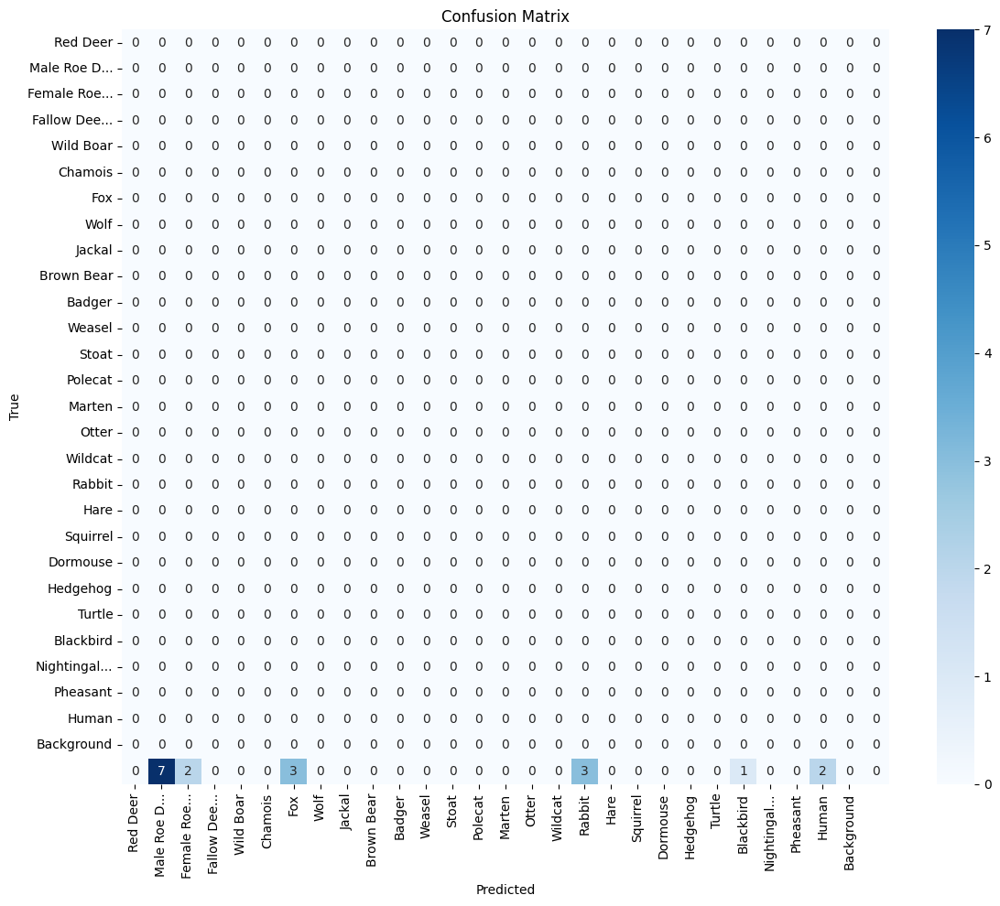


Per-class Performance:


In [7]:
# Cell 5: Model Evaluation - With focus on per-class performance and reduced memory usage

# Load the best model - with error handling
best_model_path = os.path.join(model_save_dir, 'wildlife_detector', 'weights', 'best.pt')
try:
    if os.path.exists(best_model_path):
        best_model = YOLO(best_model_path)
        print(f"Loaded best model from: {best_model_path}")
    else:
        # Try loading the last model if best isn't available
        last_model_path = os.path.join(model_save_dir, 'wildlife_detector', 'weights', 'last.pt')
        if os.path.exists(last_model_path):
            best_model = YOLO(last_model_path)
            print(f"Best model not found, loaded last model from: {last_model_path}")
        else:
            best_model = model
            print("Using the current model (no saved weights found)")
except Exception as e:
    print(f"Error loading model: {e}")
    print("Using the current model instead")
    best_model = model

# Run validation with lower batch size
try:
    print("\nRunning validation with batch size 8...")
    val_results = best_model.val(data=yaml_path, batch=8, imgsz=IMAGE_SIZE)

    print("\nOverall Validation Results:")
    print(f"mAP: {val_results.box.map:.4f}")
    print(f"mAP50: {val_results.box.map50:.4f}")
    print(f"Precision: {val_results.box.mp:.4f}")
    print(f"Recall: {val_results.box.mr:.4f}")

    # Generate confusion matrix
    try:
        if hasattr(val_results, 'confusion_matrix') and hasattr(val_results.confusion_matrix, 'matrix'):
            conf_matrix = val_results.confusion_matrix.matrix
            
            # Get class names that actually appear in the validation set
            valid_classes = []
            for i, name in enumerate(class_names):
                if i < conf_matrix.shape[0]:
                    valid_classes.append(name)
            
            # Truncate long class names for display
            class_names_display = [name[:10] + '...' if len(name) > 10 else name for name in valid_classes]
            
            # Plot confusion matrix
            plt.figure(figsize=(12, 10))
            import seaborn as sns
            sns.heatmap(conf_matrix, annot=True, fmt='.0f', 
                        xticklabels=class_names_display, 
                        yticklabels=class_names_display, 
                        cmap='Blues')
            plt.xlabel('Predicted')
            plt.ylabel('True')
            plt.title('Confusion Matrix')
            plt.tight_layout()
            plt.show()
        else:
            print("Confusion matrix not available")
    except Exception as e:
        print(f"Error generating confusion matrix: {e}")

    # Per-class metrics - important for imbalanced wildlife dataset
    print("\nPer-class Performance:")
    class_metrics = []

    for i, name in enumerate(class_names):
        try:
            # Get metrics if available
            if hasattr(val_results, 'results_dict'):
                class_precision = val_results.results_dict.get(f'metrics/precision_{i}', 0)
                class_recall = val_results.results_dict.get(f'metrics/recall_{i}', 0)
                class_map50 = val_results.results_dict.get(f'metrics/mAP50_{i}', 0)
                
                if class_precision > 0 or class_recall > 0 or class_map50 > 0:
                    class_metrics.append((name, class_precision, class_recall, class_map50))
                    print(f"{name}: Precision={class_precision:.4f}, Recall={class_recall:.4f}, mAP50={class_map50:.4f}")
        except Exception as e:
            print(f"Error processing metrics for class {name}: {e}")

    # Plot per-class metrics if available
    if class_metrics:
        try:
            import numpy as np
            
            class_names_plot = [x[0] for x in class_metrics]
            precision_values = [x[1] for x in class_metrics]
            recall_values = [x[2] for x in class_metrics]
            map_values = [x[3] for x in class_metrics]
            
            plt.figure(figsize=(14, 8))
            x = np.arange(len(class_names_plot))
            width = 0.25
            
            plt.bar(x - width, precision_values, width, label='Precision')
            plt.bar(x, recall_values, width, label='Recall')
            plt.bar(x + width, map_values, width, label='mAP50')
            
            plt.ylabel('Score')
            plt.title('Per-class Performance Metrics')
            plt.xticks(x, class_names_plot, rotation=90)
            plt.ylim(0, 1.0)
            plt.legend()
            plt.tight_layout()
            plt.show()
        except Exception as e:
            print(f"Error plotting per-class metrics: {e}")
except Exception as e:
    print(f"Error during validation: {e}")


Testing on: 1838_21_10_IMAG0013.JPG

Confidence threshold: 0.05
Objects detected: 0


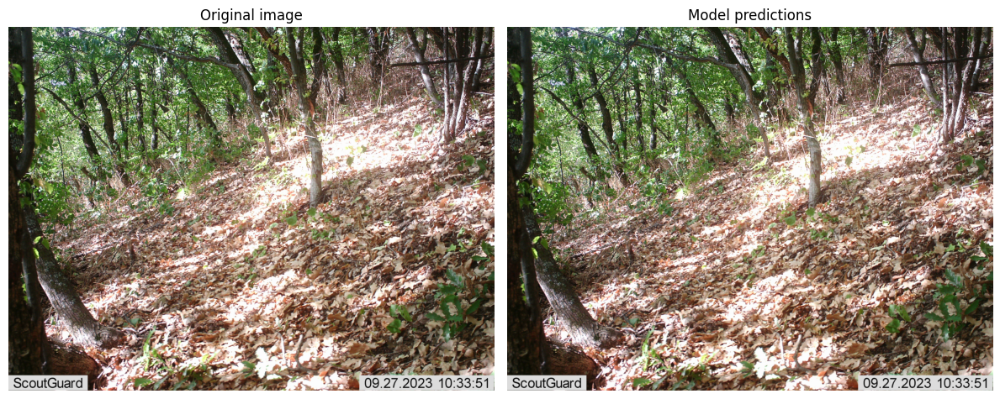


Confidence threshold: 0.02
Objects detected: 0


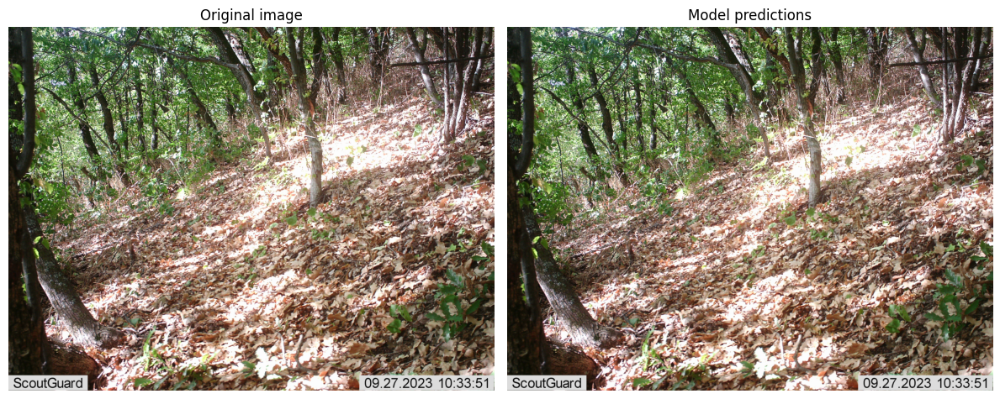


Confidence threshold: 0.01
Objects detected: 2
Object 1: Chamois, Confidence: 0.01, Position: [     2339.2        2195      2578.4      2345.5]
Object 2: Chamois, Confidence: 0.01, Position: [     2328.3      2206.2      2527.1      2350.4]


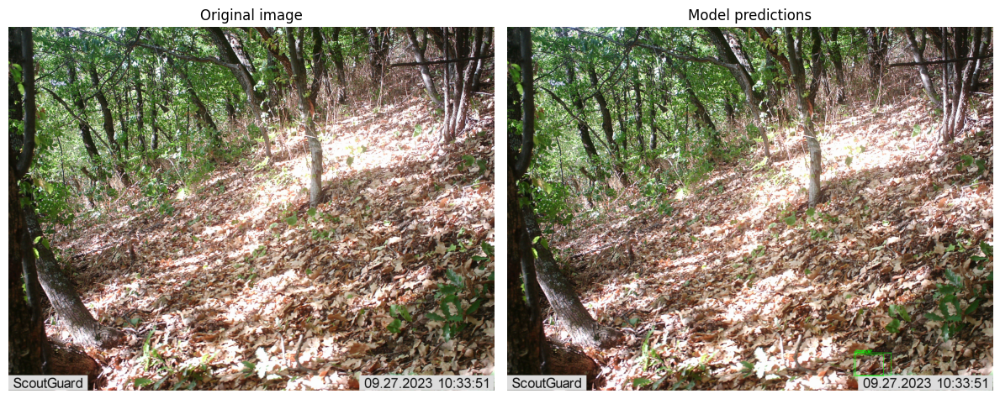


Testing on: 1826_21_10_IMAG0218.JPG

Confidence threshold: 0.05
Objects detected: 0


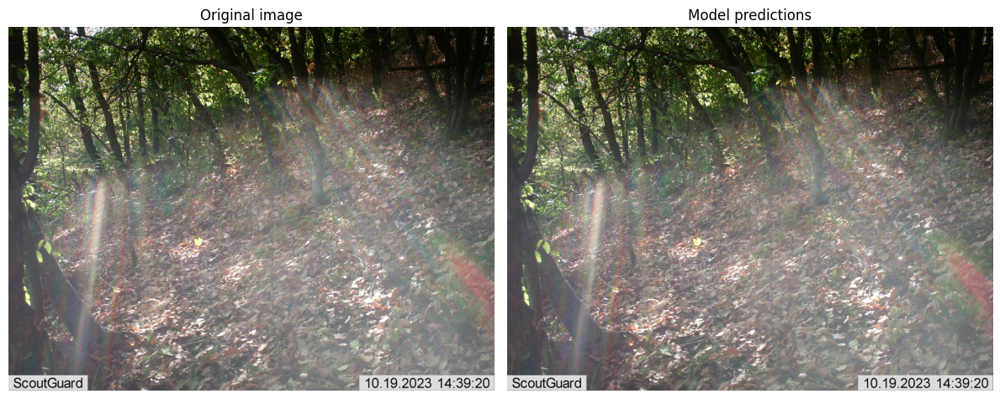


Confidence threshold: 0.02
Objects detected: 0


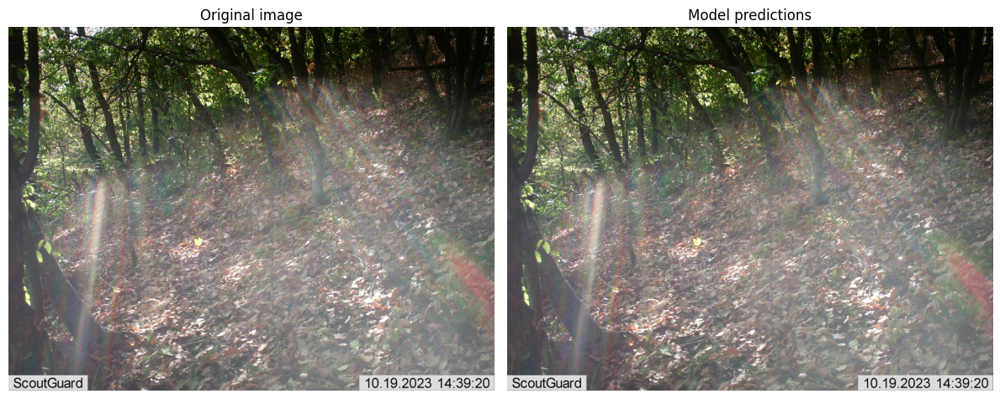


Confidence threshold: 0.01
Objects detected: 0


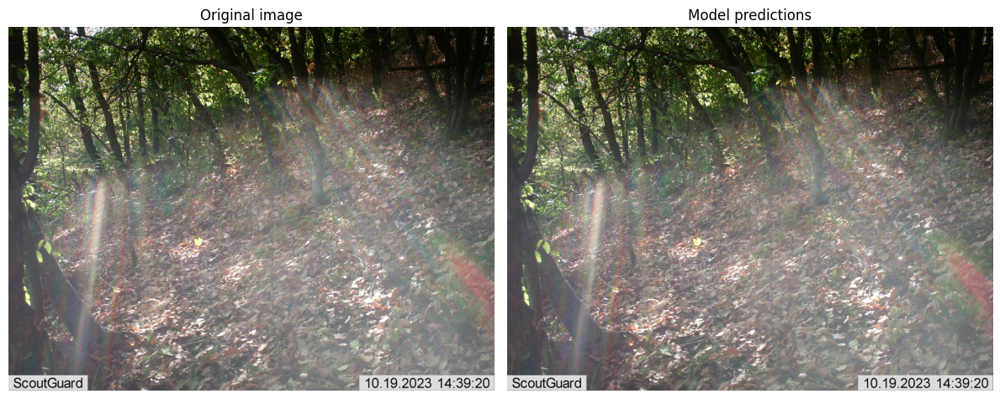


Testing on: 1409_15_03_24_Моллова_курия_IMAG0150.JPG

Confidence threshold: 0.05
Objects detected: 0


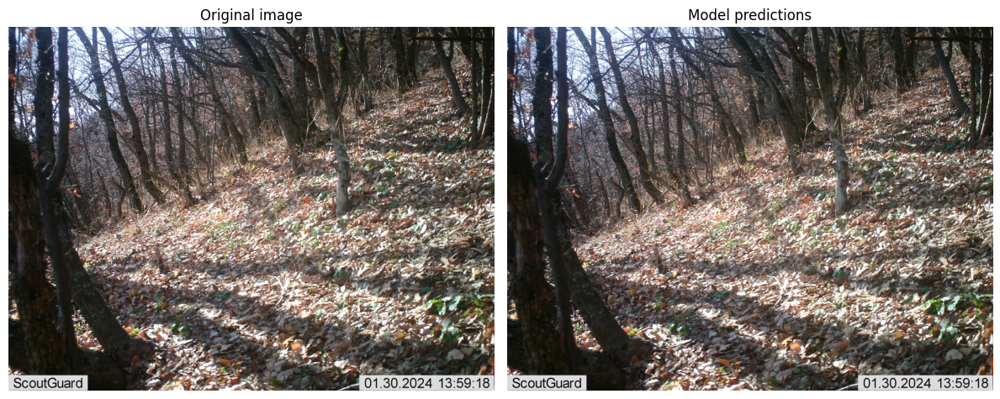


Confidence threshold: 0.02
Objects detected: 0


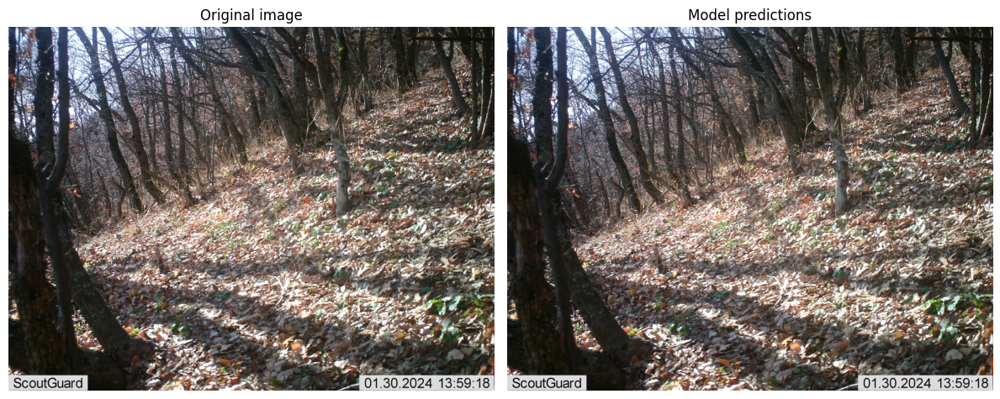


Confidence threshold: 0.01
Objects detected: 2
Object 1: Chamois, Confidence: 0.01, Position: [     3137.6      2268.2        3264      2352.3]
Object 2: Chamois, Confidence: 0.01, Position: [     3082.5      2176.3        3264      2346.9]


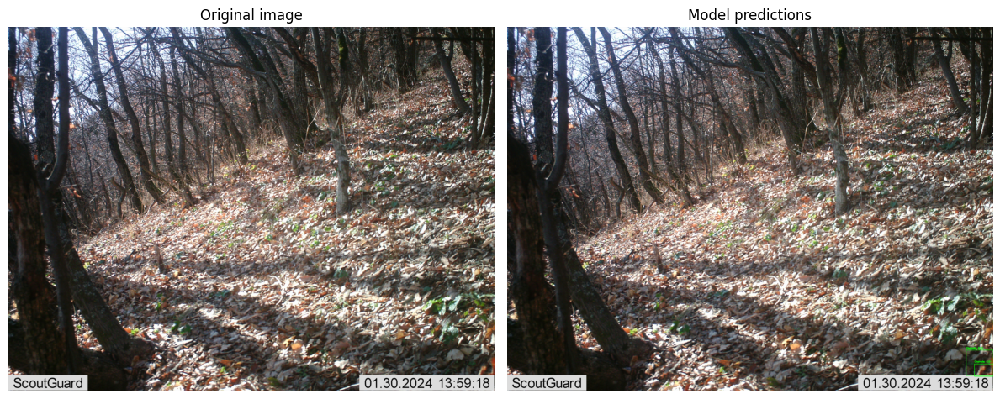


Testing on: 1126_15_03_24_Моллова_курия_IMAG0328.JPG

Confidence threshold: 0.05
Objects detected: 0


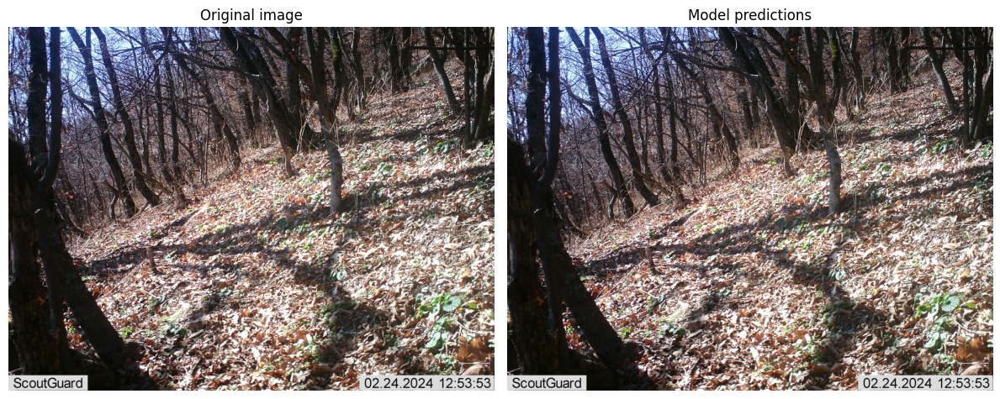


Confidence threshold: 0.02
Objects detected: 0


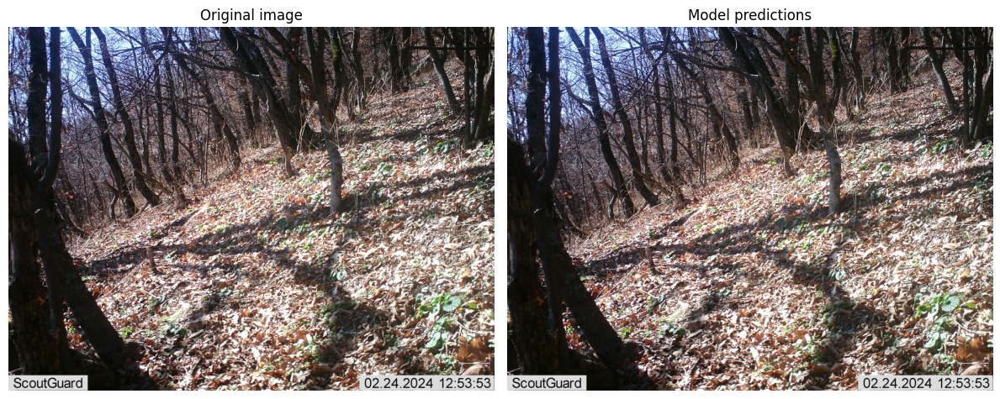


Confidence threshold: 0.01
Objects detected: 3
Object 1: Chamois, Confidence: 0.01, Position: [     1987.3      2227.7        2210        2363]
Object 2: Chamois, Confidence: 0.01, Position: [     2121.9      2249.2      2396.5      2443.4]
Object 3: Chamois, Confidence: 0.01, Position: [     1875.3      2222.1      2189.8      2386.6]


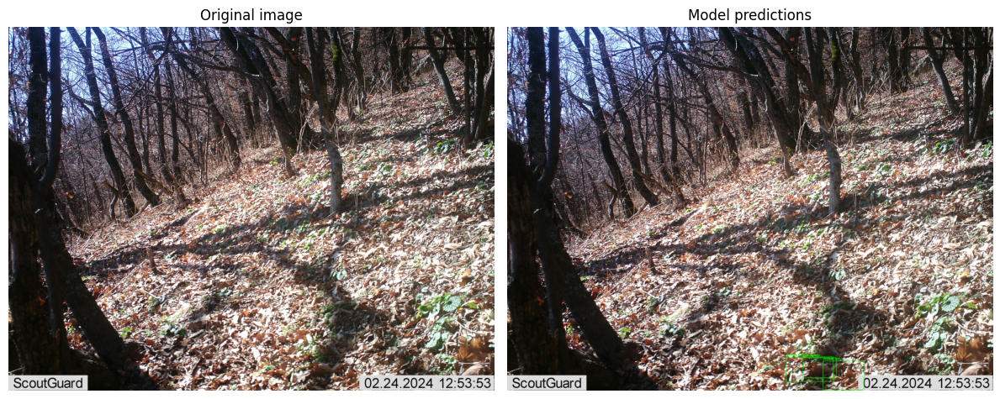


Testing on: 0856_4_08_IMAG0005.JPG

Confidence threshold: 0.05
Objects detected: 0


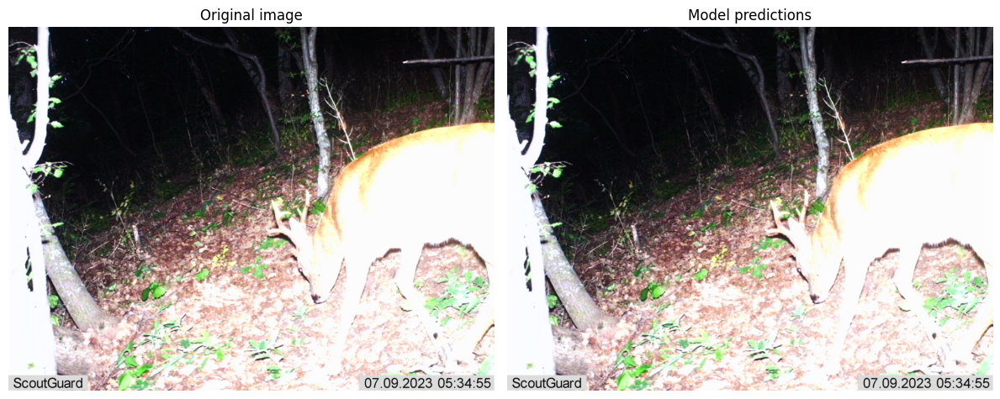


Confidence threshold: 0.02
Objects detected: 0


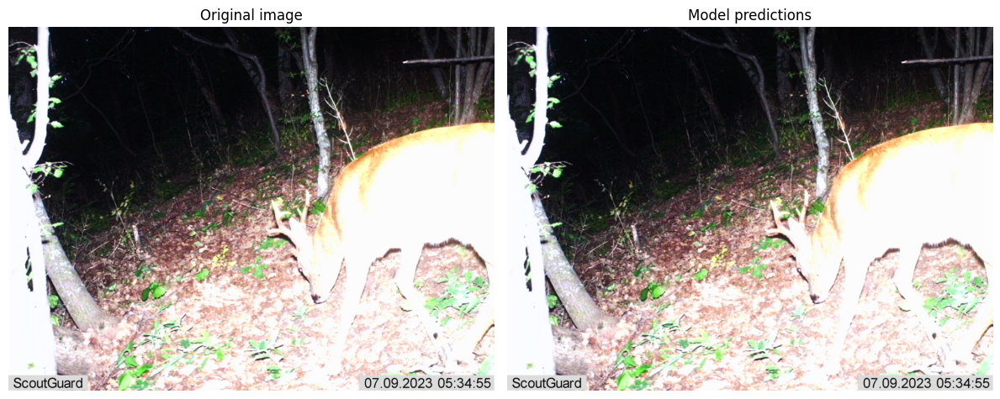


Confidence threshold: 0.01
Objects detected: 0


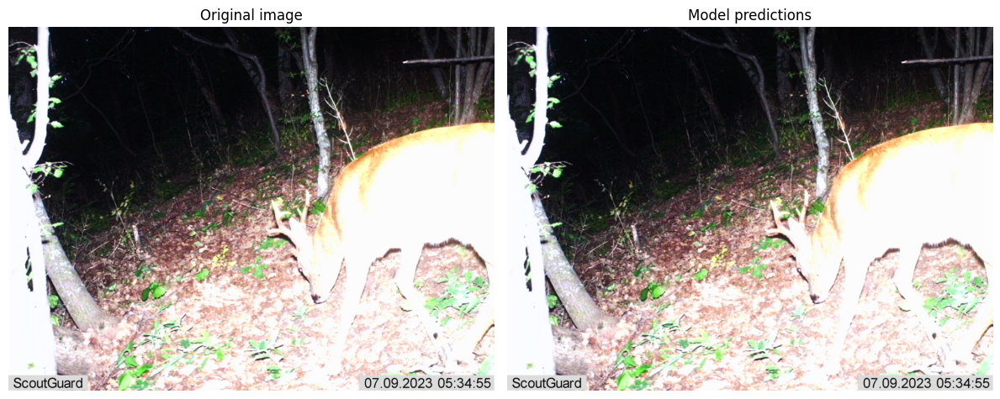

In [8]:
# Cell 6: Testing the model on sample images with very low confidence thresholds
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path

# Function for visualizing model predictions
def visualize_detection(image_path, model, conf_threshold=0.05):
    """
    Visualizes model detections on an image
    """
    # Load and display the original image
    img = cv2.imread(image_path)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    plt.figure(figsize=(12, 9))
    plt.subplot(1, 2, 1)
    plt.imshow(img_rgb)
    plt.title("Original image")
    plt.axis('off')
    
    # Run prediction with very low confidence threshold
    results = model.predict(image_path, conf=conf_threshold, verbose=False)[0]
    
    # Visualize results
    plt.subplot(1, 2, 2)
    
    # Copy image for visualization
    img_result = img_rgb.copy()
    
    # Extract prediction data
    boxes = results.boxes.xyxy.cpu().numpy()
    confs = results.boxes.conf.cpu().numpy()
    cls_ids = results.boxes.cls.cpu().numpy().astype(int)
    
    # Print number of detected objects
    print(f"Objects detected: {len(boxes)}")
    
    # Draw bounding boxes
    for i, box in enumerate(boxes):
        x1, y1, x2, y2 = box.astype(int)
        conf = confs[i]
        cls_id = cls_ids[i]
        cls_name = model.names[cls_id]
        
        color = (0, 255, 0)  # Green color for boxes
        cv2.rectangle(img_result, (x1, y1), (x2, y2), color, 2)
        
        # Text with class and confidence
        label = f"{cls_name}: {conf:.2f}"
        cv2.putText(img_result, label, (x1, y1-10), 
                    cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 2)
        
        print(f"Object {i+1}: {cls_name}, Confidence: {conf:.2f}, Position: {box}")
    
    plt.imshow(img_result)
    plt.title("Model predictions")
    plt.axis('off')
    plt.tight_layout()
    plt.show()
    
    return results

# Test on sample images from validation set
val_img_dir = os.path.join(yolo_dataset_path, 'images/val')
test_images = []

# Find a few sample images
for root, dirs, files in os.walk(val_img_dir):
    for file in files:
        if file.lower().endswith(('.jpg', '.jpeg', '.png')):
            test_images.append(os.path.join(root, file))
            if len(test_images) >= 5:  # Limit to 5 examples
                break
    if len(test_images) >= 5:
        break

# Test model on images with very low confidence thresholds
for image_path in test_images:
    print(f"\nTesting on: {os.path.basename(image_path)}")
    # Try with increasingly lower confidence thresholds
    for conf_threshold in [0.05, 0.02, 0.01]:  # Much lower thresholds to catch weak predictions
        print(f"\nConfidence threshold: {conf_threshold}")
        results = visualize_detection(image_path, best_model, conf_threshold)
        
# Optional: Test on custom images
custom_images = [
    # Add paths to your test images here
]

for image_path in custom_images:
    if os.path.exists(image_path):
        print(f"\nTesting custom image: {os.path.basename(image_path)}")
        results = visualize_detection(image_path, best_model, conf_threshold=0.01)  # Very low threshold